# Семинар 7: Метод опорных векторов

In [2]:
### imports
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image
import requests
import pandas as pd
import itertools
from sklearn.gaussian_process import kernels

# UMAP

Видео: https://www.youtube.com/watch?v=iPV7mLaFWyE

Статья: https://pair-code.github.io/understanding-umap/

Документация: https://umap-learn.readthedocs.io/en/latest/how_umap_works.html

## Какая цель?



* t-SNE не адресует к глобальной структуре данных: пример с [Fashion MNIST](https://pair-code.github.io/understanding-umap/)
* Вычислительная сложность t-SNE $\mathcal{O}(n^2)$ -- это много для реальных наборов данных. [Ускорения](https://arborjs.org/docs/barnes-hut) t-SNE дают $\mathcal{O}(n\log n)$
* Построить алгоритм с более сильным математическим обоснованием


Оригинальная статья: https://arxiv.org/pdf/1802.03426



## Topological Data Analysis

Пусть у нас есть данные $X \in \mathbb{R}^{n\times d}$. Каждый сэмпл $x_i$ можно отобразить в виде точки в многомерном пространстве $\mathbb{R}^d$ (the ambient space).

Какую описать форму точек $x_i$ в $\mathbb{R}^d$? Этим занимается [Гомология](https://en.wikipedia.org/wiki/Homology_(mathematics))

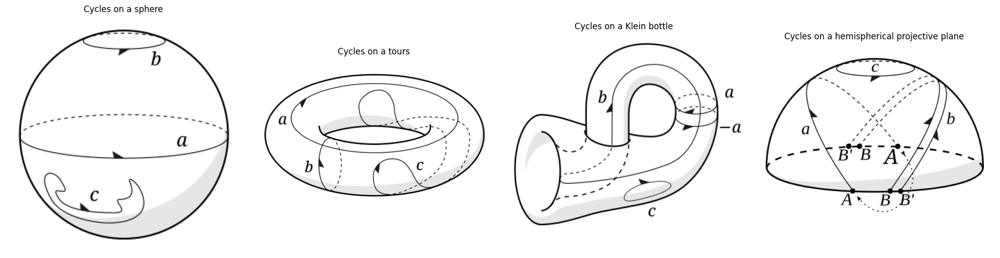

In [8]:
import matplotlib.pyplot as plt
import urllib.request
from PIL import Image
import io

def composite_plot(urls, map_names):
    fig, axes = plt.subplots(1, len(urls), figsize=(5 * len(urls), 5))
    for i, (ax, url) in enumerate(zip(axes, urls)):
        with urllib.request.urlopen(url) as response:
            image_data = response.read()
        image = Image.open(io.BytesIO(image_data))
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(map_names[i+1])

    plt.tight_layout()
    plt.show()

urls = [
    "https://upload.wikimedia.org/wikipedia/commons/thumb/2/2b/Spherecycles1.svg/282px-Spherecycles1.svg.png",
    "https://upload.wikimedia.org/wikipedia/commons/thumb/6/67/Toruscycles1.svg/452px-Toruscycles1.svg.png",
    "https://upload.wikimedia.org/wikipedia/commons/thumb/2/23/Kleincycles1.svg/340px-Kleincycles1.svg.png",
    "https://upload.wikimedia.org/wikipedia/en/thumb/5/5a/Projectivecycles2.svg/378px-Projectivecycles2.svg.png"
]
map_names = {1: 'Cycles on a sphere',
             2: 'Cycles on a tours',
             3: 'Cycles on a Klein bottle',
             4: 'Cycles on a hemispherical projective plane'}
composite_plot(urls, map_names)

### Как определять характеристики поверхности?

Треугольники! (полигональное покрытие)

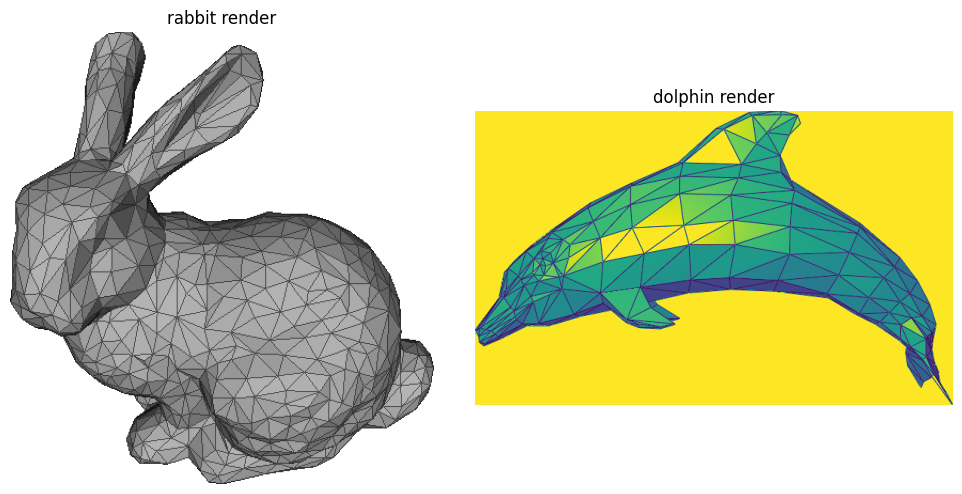

In [13]:
render_urls = ['https://www.lix.polytechnique.fr/~maks/Verona_MPAM/TD/TD2/images/snapshot00.png',
               'https://upload.wikimedia.org/wikipedia/commons/f/fb/Dolphin_triangle_mesh.png']
map_render_names = {1: 'rabbit render', 2: 'dolphin render'}
composite_plot(render_urls, map_render_names)

Обощением являются симплексы

In [5]:
Image(url='https://i.sstatic.net/O6xtg.png', width=800)

### Как строить полигональные покрытия?

Такая процедура называется фильтрацией (filtration)

In [7]:
Image(url='https://www.researchgate.net/publication/331793357/figure/fig3/AS:11431281272446038@1724104691020/Simplicial-complex-forming-over-increasing-proximity-parameter-e-Points-are-joined-into.tif', width=1000)

Покрытия можно собирать разными размерностями симплексов

In [11]:
Image(url='https://www.researchgate.net/publication/349067888/figure/fig4/AS:1021430967840774@1620539528972/Basic-simplexes-and-simplicial-complex-construction-in-a-given-radius-of-filtration-a.ppm', width=700)

Определять симплексы в пространстве можно аналогично кликам в графе. Выбор симплексов (клик) задаёт "тип" комплекса.

In [14]:
Image(url='https://www.researchgate.net/publication/376917724/figure/fig1/AS:11431281214913961@1703856083600/The-construction-of-a-simplicial-complex-from-a-point-cloud-First-a-grouping-scale-is.png', width=800)

Клик много. Как их "связывать"?

Для этого определяют симплексный комплекс (simplicial complex)

In [18]:
Image(url='https://menchelab.com/files/menchelab/research%20media/joel_network.png', width=800)

комплекс описывает многообразие, на котором мы "располагаем" объекты.

Существует 2 основных симплексных комплекса

In [20]:
Image(url='https://i.sstatic.net/H1vuM.png', width=600)

Визуализация процесса фильтрации?

In [17]:
Image(url='https://raw.githubusercontent.com/giotto-ai/giotto-tda/6f896531b7c59216fd292018bf73728dea40b7e6/examples/images/vietoris_rips_point_cloud.gif', width=500)

## U -- Uniform

Интуиция UMAP следующая:

1. Давайте построим симплексный комплекс, который хорошо будет описывать многообразие, на котором лежат наши высокоразмерные данные

2. А дальше мы поставим задачу оптимизации таким образом, чтобы уменьшить размерность вершин этого графа, сохранив его структуру.

Симплексный комплекс определяется радиусом окружности при фильтрации. Как его подобрать корректно?

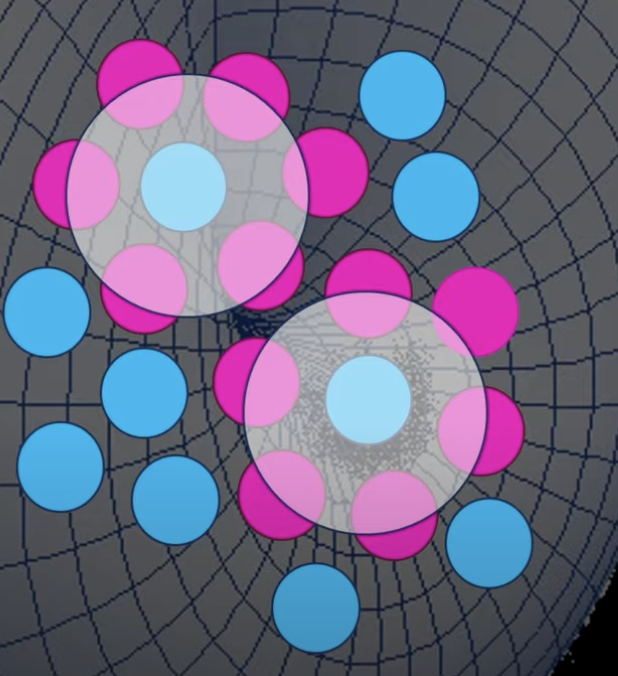

In [24]:
Image('uniform_map_on_manifold.png', width=400)

Если данные на многообразии расположены равномерно, то для каждого радиуса мы получим одинаковое количество соседей для каждой точки, и соответственно правильно подберём "радиус" для описания геометрии датасета.

Таким образом, в UMAP вводится первый гиперпараметр (`nearest_neighbour`), вместо радиуса, который является специфичным под каждый датасет (вспоминаем DBSCAN)

Существует [теорема](https://en.wikipedia.org/wiki/Nerve_complex#Nerve_theorems), которое формально это доказывает

Однако реальные данные, конечно же, не располагаются равномерно.

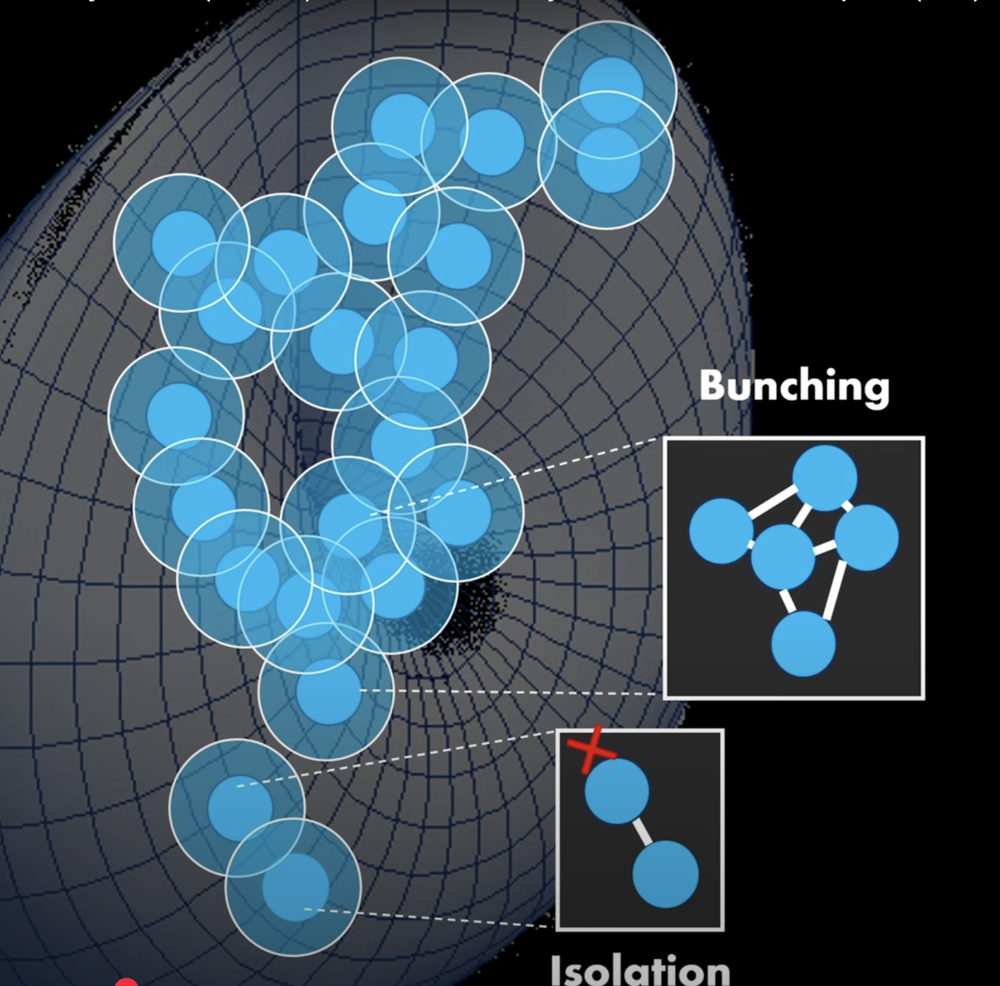

In [25]:
Image('non_uniform_map_on_manifold.png', width=400)

Как это решить?

### MA -- Manifold Approximation

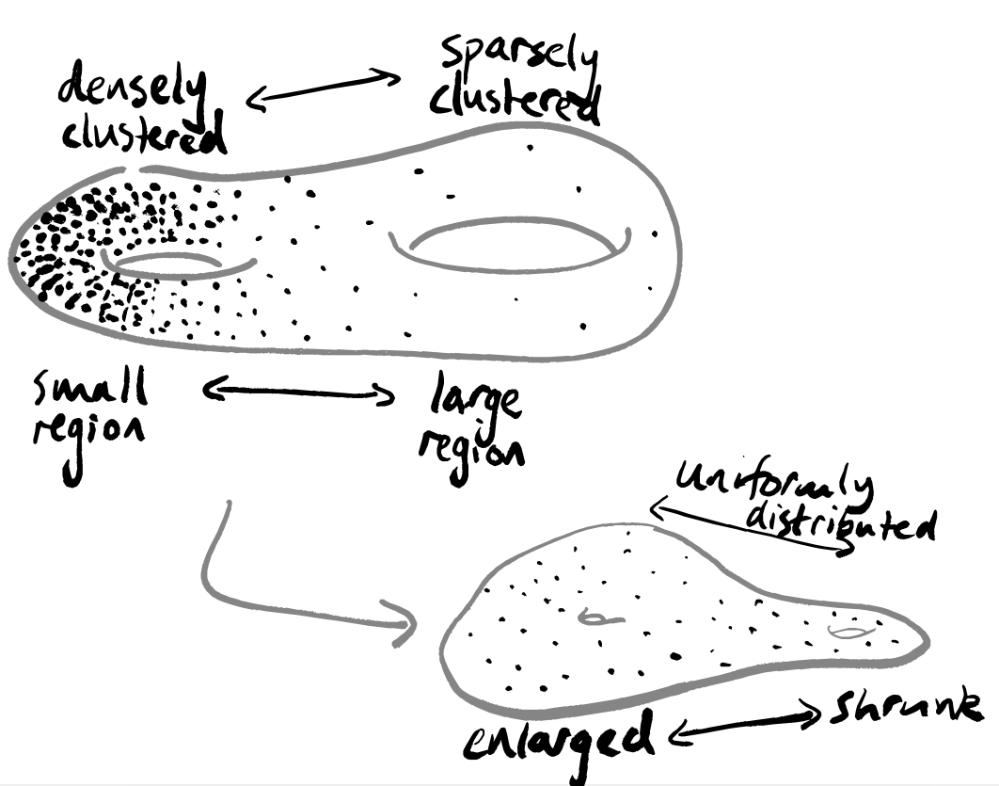

In [26]:
Image('https://topos.institute/blog/2024-04-05-understanding-umap/images/7-selective-stretching.png', width=800)

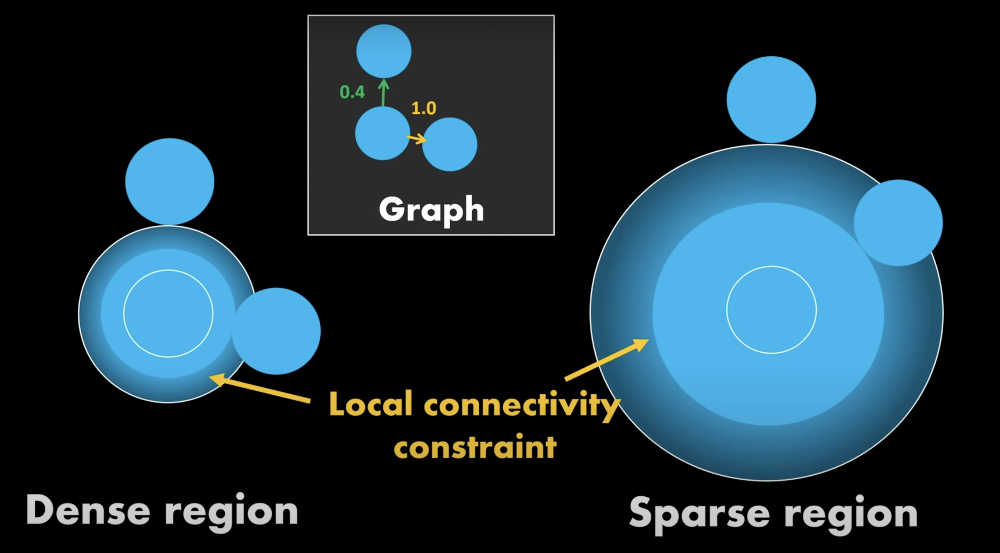

In [28]:
Image('lc_constrain.png', width=800)

Получаемая функция расстояния. Пусть $X_i$ содержит $k$ соседей $X_{i_1}, \ldots X_{i_k}$. Ближайший сосед $X_{i_j}$ и $\rho_j = d(X_i, X_{i_j})$. Тогда

$$
\rho(X_i, X_{i_p}) = \exp\left\{\dfrac{\max[0, d(X_i, X_{i_p}) - \rho_j]}{\sigma_p^2} \right\}
$$
Где $\sigma_p^2$ подбираются из условий нормировки
$$
\sum_{p=1}^k \rho(X_i, X_{i_p}) = \log_2k
$$

Таким образом для точки $X_i$ мы можем построить взвешенный граф, который подходящим образом описывает структуру датасета относительно неё.

Далее имеем $n$ таких графов

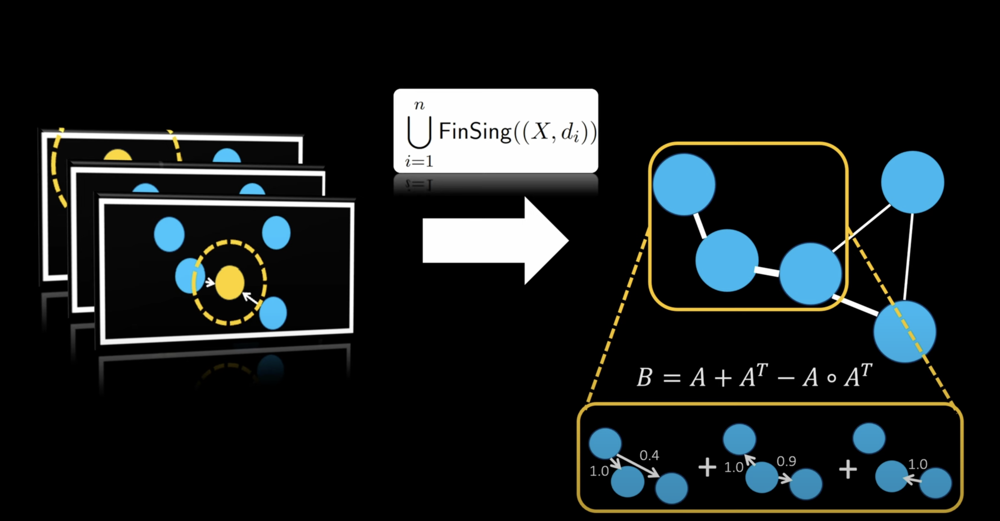

In [30]:
Image('fuzzy_simplicial_complex.png', width=800)

$$
P(X_i - X_j) = P(\{X_i \rightarrow X_j \} \cup \{X_j \rightarrow X_i\}) = P(\{X_i \rightarrow X_j \}) + P(\{X_j \rightarrow X_i \}) - P(\{X_i \rightarrow X_j \})P(\{X_j \rightarrow X_i \})
$$

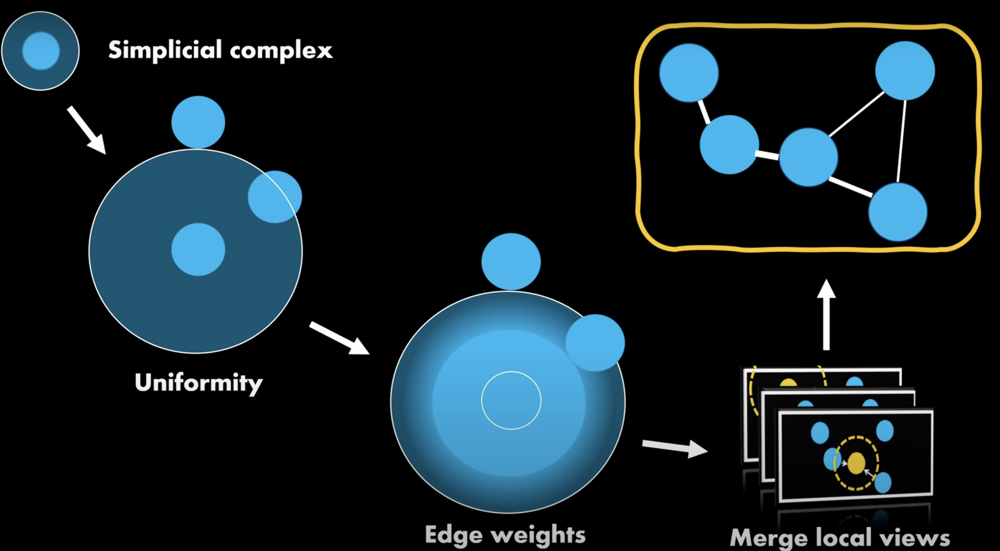

In [31]:
Image('full_stage1_procedure.png', width=800)

## План Семинара:


1.   https://quantum-ods.github.io/qmlcourse/book/qsvm/ru/classic_svm.html
2.   Краткое напоминание теории: постановка задачи, ядерный переход, теорема Мерсера, пример с нелинейным разделением.
3.   SVC и SVR (Мб с SVR можно комбинить ядра по аналогии с гаусовской регрессией).



### Интуиция метода опорных векторов

На рисунке представлена линейно-разделимая выборка. Слева изображены 2 прямые (гиперплоскости), разделяющие её. *Интуитивно*, синяя прямая лучше разделяет обучающую выборку, так как расстояние от объектов до до неё больше, чем для красной и она лучше будет разделять другие примеры из того же распределения. То есть такой линейный классификатор будет лучше обобщаться на новые данные. Теория подтверждает описанную интуицию [[1](https://www.academia.edu/download/86186744/lecture_3.pdf)].

*Метод опорных векторов (Support Vector Machine, SVM)* основан на идее построения оптимального разделения между классами.

In [ ]:
Image(url='https://quantum-ods.github.io/qmlcourse/_images/linclass_margins.png', width=1000)

### Построение оптимизационной задачи

In [ ]:
Image(url='https://quantum-ods.github.io/qmlcourse/_images/distance_to_the_plane.png', width=1000)

Расстояние от точки $x_A$ до плоскости $\langle w,x \rangle = 0$:
$$
\rho(x^A, \langle w,x \rangle = 0) = \dfrac{\langle w,x^A \rangle}{\|w\|}
$$

Рассмотрим линейный классификатор $a(x) = sign(\langle w,x \rangle + b)$, $w \in \mathbb{R}^d, b \in \mathbb{R}$. Без ограничения общности положим $\min_{x\in X}|\langle w,x \rangle + b| = 1$. В противном случае соответствующим образом отнормируем параметры классификатора.

Расстояние от выборки X до гиперплоскости:
$$
\rho(X, a) = \min_{x \in X}\rho(x, a) = \dfrac{\min_{x\in X}|\langle w,x \rangle + b|}{\|w\|} = \dfrac{1}{\|w\|}
$$

Тогда, оптимизация строится вокруг максимизации зазора при условии корректного разделения:
$$
\begin{cases}
\dfrac{1}{2}\|w\|^2 \rightarrow \min_{w, b} \\
y_i(\langle w,x_i \rangle + b) \geqslant 1, & i=1,\ldots, l.
\end{cases}
$$
Выражение $M(x_i, y_i, w) = y_i\langle w,x_i\rangle$ называют **отступом классификации** (margin).

Если выборка линейно-неразделимая, то $\exists\, x_i \in X: y_i(\langle w,x_i \rangle + b) < 1$. Давайте *смягчим* ограничение, введя штраф $\xi_i$.
$$
\begin{cases}
\dfrac{1}{2}\|w\|^2 + C \sum_{i=1}^\ell \xi_i\rightarrow \min_{w, b, \xi} \\
y_i(\langle w,x_i \rangle + b) \geqslant 1 - \xi_i, & i=1,\ldots, \ell, \\
\xi_i \geqslant 0, & i=1,\ldots, \ell.
\end{cases} \tag{1}
$$

Полученная система является задачей *условной оптимизации*, её можно решить через условия *Каруша-Куна-Таккера*.

Решение задачи зависит от конкретных значений параметров системы. Их можно разбить на 3 категории, интерпретируемых через расстояние примера обучающей выборки до разделяющей гиперплоскости:


*   *Периферийный пример*
*   *Опорный граничный пример*
*   *Опорный нарушитель-пример*





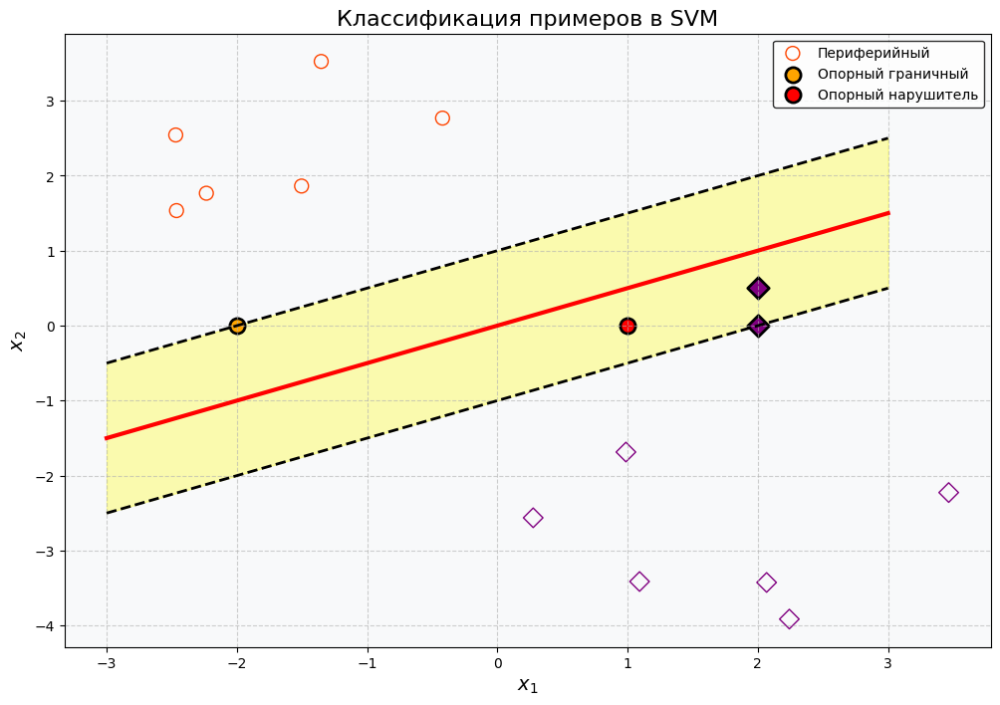

In [ ]:
np.random.seed(42)
class_1 = np.random.randn(6, 2) + [-2, 2]
class_2 = np.random.randn(6, 2) + [2, -2]

support_bound_class_1 = [-2.0, 0.0]
support_bound_class_2 = [2.0, 0.0]
support_error_class_1 = [1.0, 0.0]
support_correct_class_2 = [2.0, 0.5]

x_vals = np.linspace(-3, 3, 100)
decision_boundary = 0.5 * x_vals
margin_up = 0.5 * x_vals + 1
margin_down = 0.5 * x_vals - 1

fig, ax = plt.subplots(figsize=(12, 8))
ax.set_facecolor("#f8f9fa")

ax.scatter(class_1[:, 0], class_1[:, 1], s=100, facecolors="none", edgecolors="orangered", label="Периферийный")
ax.scatter(class_2[:, 0], class_2[:, 1], s=100, facecolors="none", edgecolors="purple", marker="D")

ax.plot(x_vals, decision_boundary, "r-", linewidth=3)
ax.plot(x_vals, margin_up, "k--", linewidth=2)
ax.plot(x_vals, margin_down, "k--", linewidth=2)
ax.fill_between(x_vals, margin_down, margin_up, color="yellow", alpha=0.3)

ax.scatter(support_bound_class_1[0], support_bound_class_1[1], s=120, facecolors="orange", edgecolors="black", label="Опорный граничный", linewidth=2)
ax.scatter(support_bound_class_2[0], support_bound_class_2[1], s=120, facecolors="purple", edgecolors="black", linewidth=2, marker="D")
ax.scatter(support_error_class_1[0], support_error_class_1[1], s=120, facecolors="red", edgecolors="black", label="Опорный нарушитель", linewidth=2)
ax.scatter(support_correct_class_2[0], support_correct_class_2[1], s=120, facecolors="purple", edgecolors="black", linewidth=2, marker="D")

ax.set_xlabel(r"$x_1$", fontsize=14)
ax.set_ylabel(r"$x_2$", fontsize=14)
ax.set_title("Классификация примеров в SVM", fontsize=16)
ax.legend(loc="upper right", fontsize=10, frameon=True, edgecolor="black")
ax.grid(True, linestyle="--", alpha=0.6)

#### Как полученная система уравнений связана с линейным классификатором?

https://education.yandex.ru/handbook/ml/article/linear-models

Давайте вспомним задачу линейной классификации
$$
\dfrac{1}{N} \sum_{i=1}^N \mathbb{I}[M_i < 0] → \min_{w}
$$
Полученный функционал является кусочно-постоянным, его аппроксимируют гладкой функцией. Рассмотрим hinge-loss $\max\{0, 1 - M_i\}$ с $\ell_2$-регуляризацией:
$$
\dfrac{1}{N} \sum_{i=1}^N \max\{0, 1 - y_i(\langle w, x_i\rangle + b)\} + \dfrac{\alpha}{2}\|w\|^2 → \min_{w, b}
$$
Систему ограничений $y_i(\langle w,x_i \rangle + b) \geqslant 1 - \xi_i,\,\,\, i=1,\ldots, \ell$, $\,\,\,\xi_i \geqslant 0$ можно аппроксимировать как $\xi_i = \max\{0, 1 - y_i(\langle w, x_i\rangle + b)\}$. Тогда систему (1) можно переписать:
$$
\dfrac{1}{2}\|w\|^2 + C \sum_{i=1}^\ell\max\{0, 1 - y_i(\langle w, x_i\rangle + b)\} \rightarrow \min_{w, b},
$$
что с точностью до домножения на $\frac{1}{CN}$ и переобозначения $\alpha = \frac{1}{CN}$ эквивалентно задаче линейного классификатора с hinge-лосс функцией потерь.

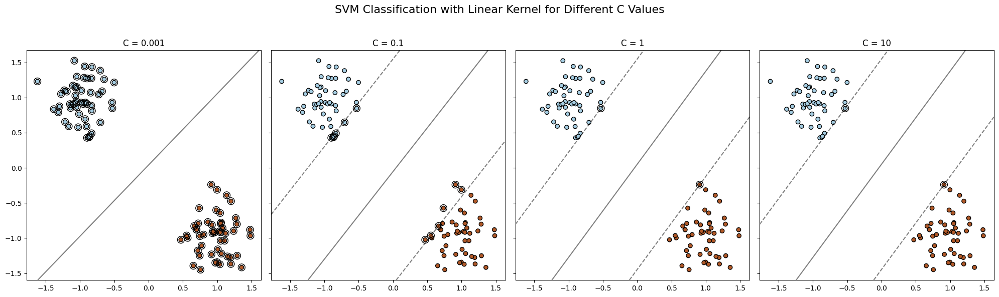

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler

# Generate a simple two-class dataset
X, y = make_blobs(n_samples=100, centers=2, random_state=42, cluster_std=1.0)
X = StandardScaler().fit_transform(X)
# List of different C values to test
C_values = [0.001, 0.1, 1, 10]

# Create subplots: one plot for each C value
fig, axes = plt.subplots(1, len(C_values), figsize=(20, 6), sharex=True, sharey=True)

for ax, C in zip(axes, C_values):
    # Train SVM with a given C value
    svm_classifier = SVC(kernel='linear', C=C)
    svm_classifier.fit(X, y)

    # Plot the training points
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Paired, edgecolors='k')

    # Plot support vectors
    ax.scatter(svm_classifier.support_vectors_[:, 0],
               svm_classifier.support_vectors_[:, 1],
               s=100, linewidth=1, facecolors='none', edgecolors='k')

    # Get current axes limits
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    # Create grid to evaluate the model
    xx = np.linspace(xlim[0], xlim[1], 30)
    yy = np.linspace(ylim[0], ylim[1], 30)
    YY, XX = np.meshgrid(yy, xx)
    xy = np.vstack([XX.ravel(), YY.ravel()]).T

    # Evaluate decision function over the grid
    Z = svm_classifier.decision_function(xy).reshape(XX.shape)

    # Plot decision boundary and margins
    ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1],
               alpha=0.5, linestyles=['--', '-', '--'])

    ax.set_title(f"C = {C}")

plt.suptitle("SVM Classification with Linear Kernel for Different C Values", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


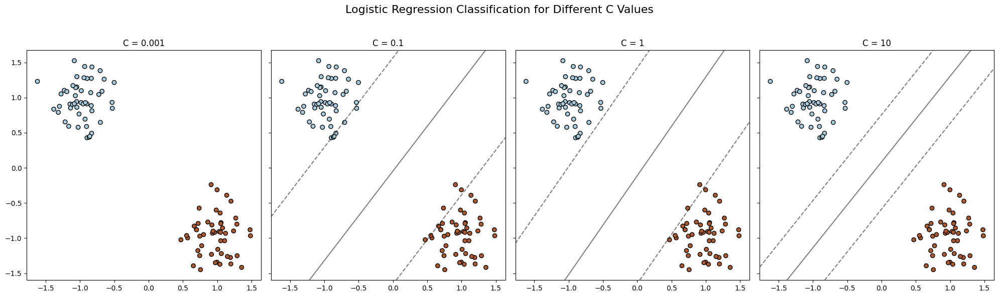

In [ ]:
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler

# Generate a simple two-class dataset
X, y = make_blobs(n_samples=100, centers=2, random_state=42, cluster_std=1.0)
X = StandardScaler().fit_transform(X)
y = np.where(y == 0, -1, 1)  # Convert labels to {-1, 1}

# List of different regularization strengths (inverse of C)
C_values = [0.001, 0.1, 1, 10]

# Create subplots: one plot for each C value
fig, axes = plt.subplots(1, len(C_values), figsize=(20, 6), sharex=True, sharey=True)

for ax, C in zip(axes, C_values):
    # Train Logistic Regression with a given regularization strength
    logreg_classifier = SGDClassifier(loss="hinge", alpha=1/(C*X.shape[0]))
    logreg_classifier.fit(X, y)

    # Plot the training points
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Paired, edgecolors='k')

    # Get current axes limits
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    # Create grid to evaluate the model
    xx = np.linspace(xlim[0], xlim[1], 30)
    yy = np.linspace(ylim[0], ylim[1], 30)
    YY, XX = np.meshgrid(yy, xx)
    xy = np.vstack([XX.ravel(), YY.ravel()]).T

    # Evaluate decision function over the grid
    Z = logreg_classifier.decision_function(xy).reshape(XX.shape)

    # Plot decision boundary and margins
    # ax.contour(XX, YY, Z, colors='k', levels=[0.5], alpha=0.5,
    #            linestyles=['-'])
    ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1],
               alpha=0.5, linestyles=['--', '-', '--'])

    ax.set_title(f"C = {C}")

plt.suptitle("Logistic Regression Classification for Different C Values", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### SVM unbalanced case

Давайте аналогично взвешиванию функции потерь взвешивать вклады от $\xi_i$ для разных $y_i$:
$$
\dfrac{1}{2}\|w\|^2 + C_1 \sum_{y_i = 1} \xi_i + C_2 \sum_{y_i = -1} \xi_i\rightarrow \min_{w, b, \xi}.
$$

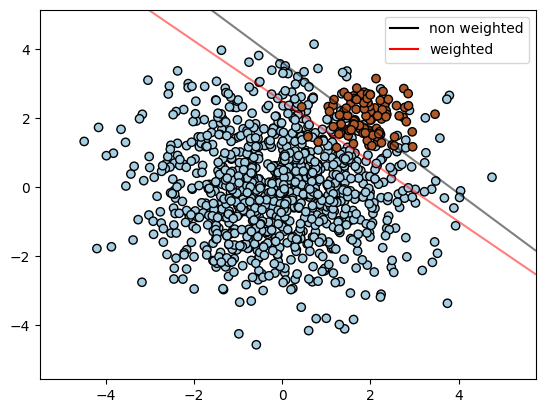

In [ ]:
# Authors: The scikit-learn developers
# SPDX-License-Identifier: BSD-3-Clause

import matplotlib.lines as mlines
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.datasets import make_blobs
from sklearn.inspection import DecisionBoundaryDisplay

# we create two clusters of random points
n_samples_1 = 1000
n_samples_2 = 100
centers = [[0.0, 0.0], [2.0, 2.0]]
clusters_std = [1.5, 0.5]
X, y = make_blobs(
    n_samples=[n_samples_1, n_samples_2],
    centers=centers,
    cluster_std=clusters_std,
    random_state=0,
    shuffle=False,
)

# fit the model and get the separating hyperplane
clf = svm.SVC(kernel="linear", C=1.0)
clf.fit(X, y)

# fit the model and get the separating hyperplane using weighted classes
wclf = svm.SVC(kernel="linear", class_weight={1: n_samples_1 / n_samples_2})
wclf.fit(X, y)

# plot the samples
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Paired, edgecolors="k")

# plot the decision functions for both classifiers
ax = plt.gca()
disp = DecisionBoundaryDisplay.from_estimator(
    clf,
    X,
    plot_method="contour",
    colors="k",
    levels=[0],
    alpha=0.5,
    linestyles=["-"],
    ax=ax,
)

# plot decision boundary and margins for weighted classes
wdisp = DecisionBoundaryDisplay.from_estimator(
    wclf,
    X,
    plot_method="contour",
    colors="r",
    levels=[0],
    alpha=0.5,
    linestyles=["-"],
    ax=ax,
)

plt.legend(
    [
        mlines.Line2D([], [], color="k", label="non weighted"),
        mlines.Line2D([], [], color="r", label="weighted"),
    ],
    ["non weighted", "weighted"],
    loc="upper right",
)
plt.show()

### Двойственная задача

Двойственность по Лагранжу:
$$
\max_{\lambda \geqslant 0} G(\lambda), \quad G(\lambda) = \inf_{x \in S_n(1)} ℒ(x, \lambda).
$$
$G(\lambda)$ -- двойственная функция, $ℒ(x, \lambda)$ -- функция Лагранжа.

Интуитивно, *двойственная функция* показывает, как изменяется оптимальное решение исходной задачи при *возмущении* ограничений.

*Двойственная задача* ищет такие возмущения, которые отражают наибольшие изменения оптимального решения.

**Добавить иллюстрирующую картинку**

В методе опорных векторов ограничениями оптимизационной задачи являются неравенства:
$$
y_i(\langle w,x_i \rangle + b) \geqslant 1 - \xi_i
$$

Для *периферийных* примеров $y_i(\langle w,x_i \rangle + b) > 1$, таким образом, возмущение ограничений отражается только на *опорных* примерах.

Двойственная задача в методе опорных векторов:
$$
\begin{cases}
\sum_{i=1}^\ell \lambda_i - \dfrac{1}{2}\sum_{i,j=1}^\ell \lambda_i\lambda_j y_i y_j \langle x_i, x_j\rangle \rightarrow \max_{\lambda} \\
0 \leqslant \lambda_i \leqslant C, \quad i=1,\ldots, \ell, \\
\sum_{i=1}^\ell \lambda_i y_i = 0.
\end{cases} \tag{1}
$$

Интуиция подтверждается решением: $\lambda_i = 0$ для всех $i$: $y_i(\langle w,x_i \rangle + b) > 1$.

### Переход в спрямляющее пространство

Одним из важнейших свойств метода опорных векторов является независимость двойственной задачи (1) от отдельных признаковых описаний $x_i$: в задаче присутствуют только скалярные произведения $\langle x_i, x_j\rangle$.

В таком случае, мы можем выполнить преобразование $\langle x_i, x_j\rangle \rightarrow \mathcal{K}(x_i, x_j)$, т.е. перейти *в спрямляющее пространство*.

In [ ]:
Image(url='https://shorturl.at/zE135', width=600)

Для этого необходимо, чтобы функция $\mathcal{K}(x_i, x_j)$ была **ядром** (англ. kernel):
$$
\mathcal{K}: \mathcal{X}\times\mathcal{X} \rightarrow \mathbb{R}, \quad \mathcal{K}(x_i, x_j) = \langle \psi(x_i), \psi(x_j) \rangle,
$$
при некотором $\psi: \mathcal{X} \rightarrow H$, где $H$ -- пространство со скалярным произведением.

Примеры распространённых ядерных функций:
* Константа $ \mathcal{K}_{C}(x,y) = C$;
* Линейное $\mathcal{K}_{L}(x,y) =  x^\top y$;
* Полиномиальное $\mathcal{K}_{d, c}(x,y) = (x^\top y + c)^d$;
* Радиально-Базисная Функция (РБФ) $\mathcal{K}_\gamma(x, y) = \exp\left\{\gamma\|x-y\|^2\right\}$;
* Сигмоида $\mathcal{K}_{c}(x,y) = \tanh{(x^\top y + c)}$

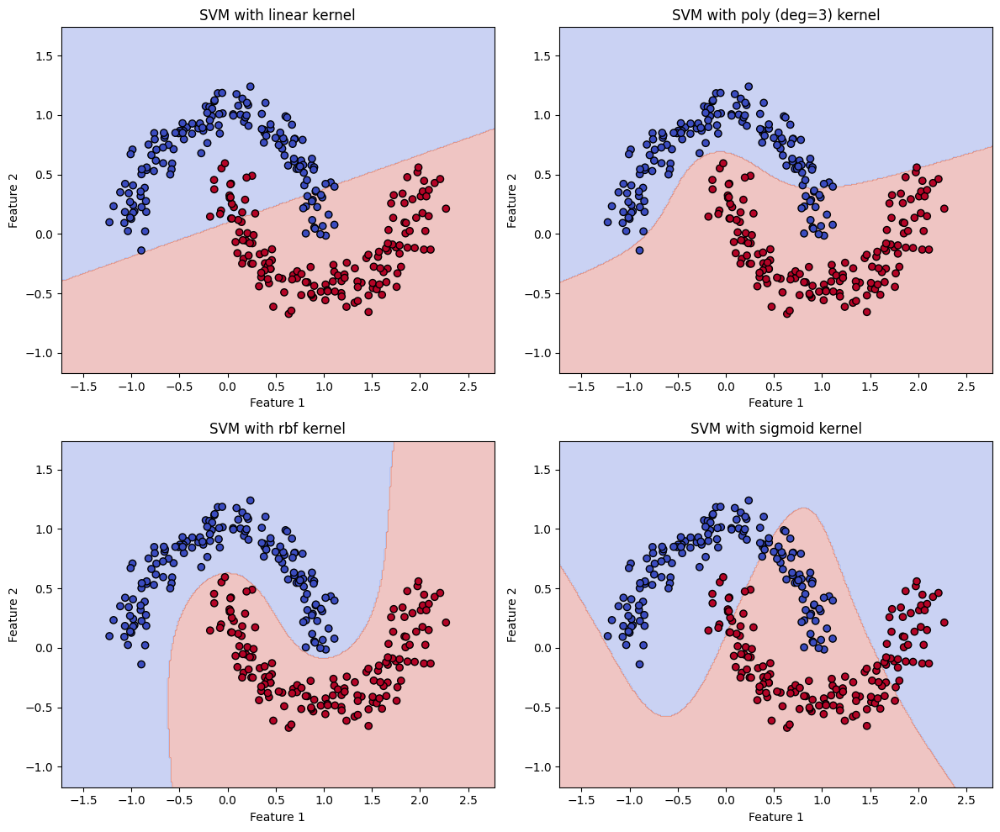

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.svm import SVC

# Generate the two moons dataset
X, y = make_moons(n_samples=300, noise=0.1, random_state=42)

# Define different kernels to compare
kernels = {
    'linear': SVC(kernel="linear", C=1.0, gamma='scale'),
    'poly (deg=3)': SVC(kernel="poly", degree=3, C=1.0, gamma='scale'),
    'rbf': SVC(kernel="rbf", C=1.0, gamma='scale'),
    'sigmoid': SVC(kernel="sigmoid", C=1.0, gamma='scale')
}

# Fit each model
for name, model in kernels.items():
    model.fit(X, y)

# Function to plot decision boundaries
def plot_decision_boundary(model, X, y, ax, title):
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 300),
                         np.linspace(y_min, y_max, 300))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

    ax.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.coolwarm)
    ax.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', cmap=plt.cm.coolwarm)
    ax.set_title(title)
    ax.set_xlabel("Feature 1")
    ax.set_ylabel("Feature 2")

# Plot decision boundaries for each kernel
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()
for i, (name, model) in enumerate(kernels.items()):
    plot_decision_boundary(model, X, y, axes[i], f"SVM with {name} kernel")
plt.tight_layout()

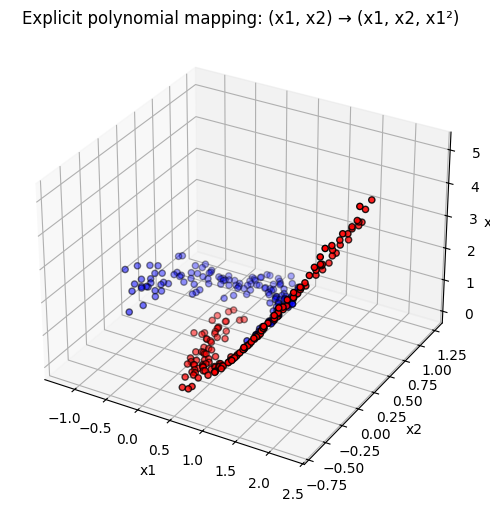

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from mpl_toolkits.mplot3d import Axes3D  # needed for 3D plotting

# Create a polynomial feature transformer (degree 2)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X)
# The transformed features are in order: [x1, x2, x1^2, x1*x2, x2^2]

# For visualization purposes, let’s plot the first three dimensions:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(X_poly[:, 0], X_poly[:, 1], X_poly[:, 2], c=y, cmap=plt.cm.bwr, edgecolor='k')
ax.set_xlabel("x1")
ax.set_ylabel("x2")
ax.set_zlabel("x1^2")
ax.set_title("Explicit polynomial mapping: (x1, x2) → (x1, x2, x1²)")
plt.show()


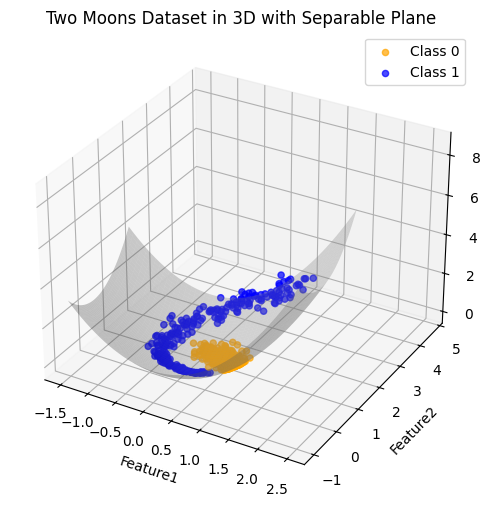

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import PolynomialFeatures

# Step 1: Generate the two moons dataset
X, y = make_moons(n_samples=500, noise=0.1, random_state=42)

poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X) # The transformed features are in order: [x1, x2, x1^2, x1*x2, x2^2]

# Step 2: Add a third dimension
X_3d = np.c_[X_poly[:, 1], X_poly[:, 2], X_poly[:, 4]]

# Step 3: Plot the 3D scatter plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for each class
for label, color in zip([0, 1], ['orange', 'blue']):
    ax.scatter(
        X_3d[y == label, 0],
        X_3d[y == label, 1],
        X_3d[y == label, 2],
        label=f'Class {label}',
        color=color,
        alpha=0.7
    )

# Step 4: Plot the separable plane (z = x^2 + y^2)
x = np.linspace(-1.5, 2.5, 50)
y = np.linspace(-1.0, 1.5, 50)
x_grid, y_grid = np.meshgrid(x, y)
z_plane = x_grid**2 + y_grid**2

ax.plot_surface(x_grid, y_grid, z_plane, alpha=0.3, color='gray')

# Step 5: Customize plot
ax.set_xlabel('Feature1')
ax.set_ylabel('Feature2')
ax.set_zlabel('Feature3 (z)')
ax.legend()
plt.title("Two Moons Dataset in 3D with Separable Plane")
plt.show()

### Операции с функциями ядра

На практике можно строить более сложные -- композиционные ядровые функции. \\
Построение композиций основано на следующем утверждении:
- Сумма ядровых функций -- ядровая функция:
$$\mathcal{K}(x, x') = \mathcal{K}_1(x, x') + \mathcal{K}_2(x, x')$$
- Произведение ядровых функций -- ядровая функция:
$$\mathcal{K}(x, x') = \mathcal{K}_1(x, x') \cdot \mathcal{K}_2(x, x')$$

Доказательство утверждения основано на [теорема Мерсера](https://en.wikipedia.org/wiki/Mercer%27s_theorem): \\
Функция $\mathcal{K}(x, x')$ является ядром тогда и только тогда, когда выполнены условия:
$$
\begin{cases}
\mathcal{K}(x, x') = \mathcal{K}(x', x ) & \text{(Симметричность)} \\
\forall\, g: \mathcal{X} \rightarrow \mathbb{R} \quad \int\limits_{\mathcal{X}}\int\limits_{\mathcal{X}}\mathcal{K}(x', x )g(x)g(x')dxdx' \geqslant 0 & \text{(неотрицательная определённость)}
\end{cases}
$$

1. **Сумма ядровых функций** \\
Симметричность
$$
\mathcal{K}(x, x') = \mathcal{K}_1(x, x') + \mathcal{K}_2(x, x') \stackrel{th. Mercer}{=} \mathcal{K}_1(x', x) + \mathcal{K}_2(x', x) \stackrel{def}{=} \mathcal{K}(x', x)
$$
Неотриц. определённость (дискретный случай)
$$
\lambda\mathcal{K}(x, x')\lambda^\top = \lambda\left(\mathcal{K}_1(x, x') + \mathcal{K}_2(x, x')\right)\lambda^\top = \lambda\mathcal{K}_1(x, x')\lambda^\top + \lambda\mathcal{K}_1(x, x')\lambda^\top \stackrel{th. Mercer}{\geqslant} 0 + 0 = 0
$$
Таким образом, по теореме Мерсера, сумма ядровых функций -- ядровая функция
2. **Произведение ядровых функций** \\
Покажем по определению: \\
$\mathcal{K}_1(x, x') = \langle \phi(x), \phi(x') \rangle$, $\mathcal{K}_2(x, x') = \langle \psi(x), \psi(x') \rangle$.
$$
\mathcal{K}(x, x') = \left(\sum_{m=1}^M \phi_m(x) \phi_m(x') \right) \left(\sum_{n=1}^N \psi_n(x) \psi_n(x') \right) \equiv \sum_{m=1}^M\sum_{n=1}^N \xi_{mn}(x) \xi_{mn}(x') = \langle \xi(x), \xi(x') \rangle,
$$
где $\xi_{mn}(x): \mathcal{X} → H$,  $\,\,\xi_{mn}(x)= \phi_m(x)\psi_n(x)$

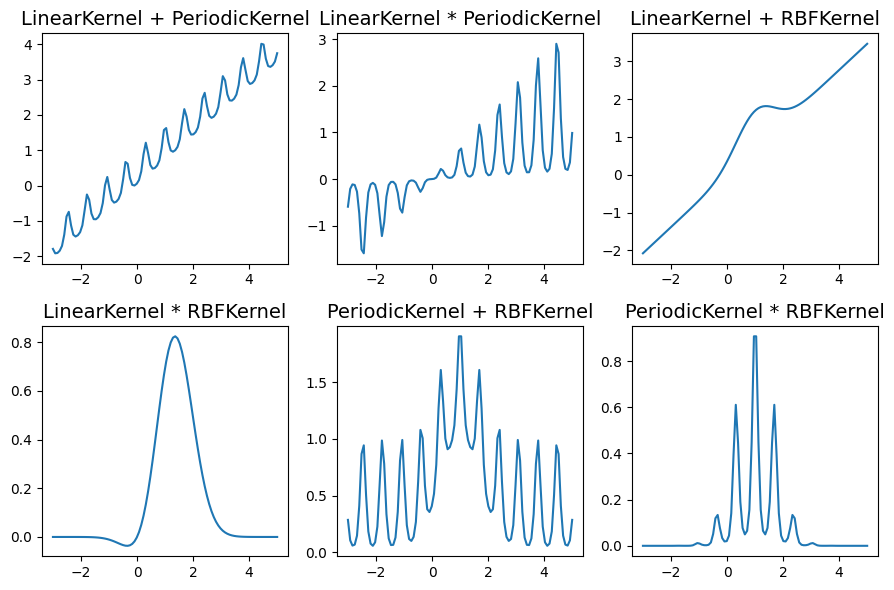

In [ ]:
from gpytorch import kernels
import torch

def plot_kernel(kernel, xlim=None, ax=None):
    if xlim is None:
        xlim = [-3, 5]
    x = torch.linspace(xlim[0], xlim[1], 100)
    with torch.no_grad():
        K = kernel(x, torch.ones((1))).evaluate().reshape(-1, 1)

    if ax is None:
        fig = plt.figure()
        ax = fig.add.subplot(111)
    ax.plot(x.numpy(), K.cpu().numpy())

covariance_functions = [kernels.LinearKernel(power=1), kernels.PeriodicKernel(),
                        kernels.RBFKernel()]

operations = {'+': lambda x, y: x + y,
              '*': lambda x, y: x * y}

figure, axes = plt.subplots(len(operations), len(covariance_functions), figsize=(9, 6))

axes = axes.ravel()
count = 0
for j, base_kernels in enumerate(itertools.combinations(covariance_functions, 2)):
    for k, (op_name, op) in enumerate(operations.items()):
        kernel = op(base_kernels[0], base_kernels[1])
        plot_kernel(kernel, ax = axes[count])
        kernel_names = [str(base_kernels[i]).split('(')[0] for i in [0, 1]]
        axes[count].set_title('{} {} {}'.format(kernel_names[0], op_name, kernel_names[1]), fontsize=14)

        count += 1
figure.tight_layout()

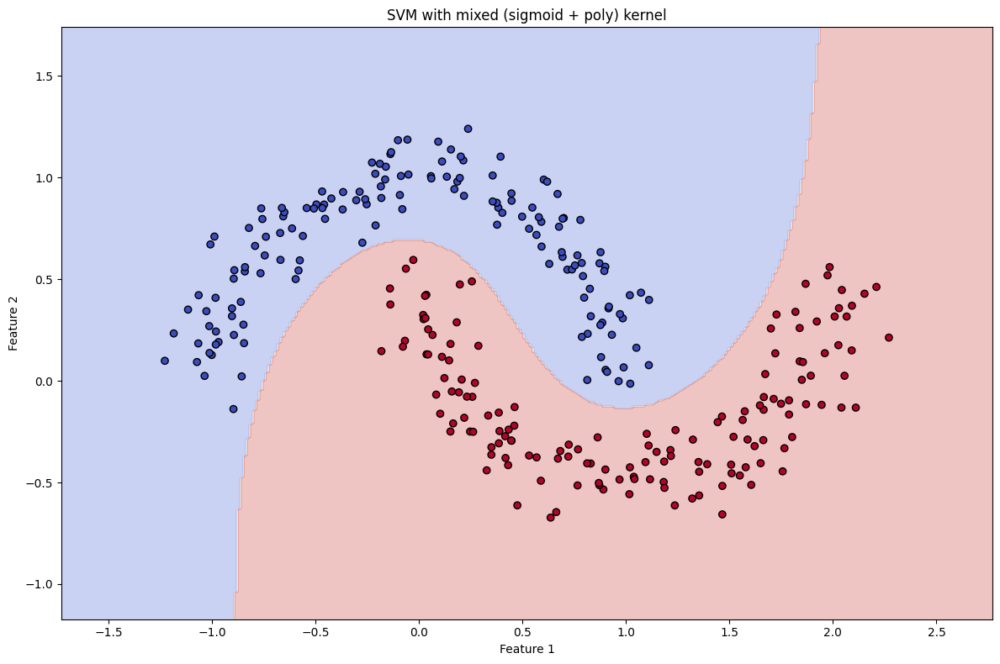

In [ ]:
# Generate the two moons dataset
X, y = make_moons(n_samples=300, noise=0.1, random_state=42)

def mixed_kernel_sigm_poly(X, Y):
    degree = 3   # degree for polynomial part; adjust as needed
    coef0 = 1
    poly = (np.dot(X, Y.T) + coef0) ** degree
    sigmoid = np.tanh(np.dot(X, Y.T) + coef0)
    return sigmoid + poly

svc_model = SVC(kernel=mixed_kernel_sigm_poly, C=1.0)
svc_model.fit(X, y)

fig, axis = plt.subplots(1, figsize=(12,8))
plot_decision_boundary(svc_model, X, y, axis, f"SVM with mixed (sigmoid + poly) kernel")
plt.tight_layout()

### Support Vector Regression

Вспомним оптимизационную задачу для Support Vector Machine (Классификация)
$$
\begin{cases}
\dfrac{1}{2}\|w\|^2 + C \sum_{i=1}^\ell \xi_i\rightarrow \min_{w, b, \xi} \\
y_i(\langle w,x_i \rangle + b) \geqslant 1 - \xi_i, & i=1,\ldots, \ell, \\
\xi_i \geqslant 0, & i=1,\ldots, \ell.
\end{cases}
$$
Ограничениями задачи являлся "мягкий порог" (англ. soft-margin) $y_i(\langle w,x_i \rangle + b) \geqslant 1 - \xi_i$.

В задаче регрессии мы смотрим на модуль разницы $|y_i - (\langle w,x_i \rangle + b)|$ -- MAE-функция потерь. Мы определяем значение $\varepsilon$, относительно которого модель нечувствительна к ошибкам. Аналогично классификации, мы стремимся минимизировать $\|w\|^2$. Здесь интуиция более практичная --

### SVR on Parkinson desease detection

Эксперименты воспроизводят результаты статьи: https://pmc.ncbi.nlm.nih.gov/articles/PMC9543766

[Данные](https://archive.ics.uci.edu/dataset/189/parkinsons+telemonitoring) представляют собой характеристики голосовой записи пациентов с болезнью Паркинсона.

В выборке представлено 42 пациента с $\sim 200$ записей на каждого. Целевым показателем является [Unified Parkinson's disease rating sacle (UPDRS)](https://en.wikipedia.org/wiki/Unified_Parkinson%27s_disease_rating_scale).

In [ ]:
!pip install ucimlrepo

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
parkinsons_telemonitoring = fetch_ucirepo(id=189)

# data (as pandas dataframes)
X = parkinsons_telemonitoring.data.features
y = parkinsons_telemonitoring.data.targets

X.columns

Index(['age', 'test_time', 'Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP',
       'Jitter:PPQ5', 'Jitter:DDP', 'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3',
       'Shimmer:APQ5', 'Shimmer:APQ11', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE',
       'DFA', 'PPE', 'sex'],
      dtype='object')

In [ ]:
X

,age,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE,sex
0,72,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006,0
1,72,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810,0
2,72,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014,0
3,72,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277,0
4,72,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5870,61,142.7900,0.00406,0.000031,0.00167,0.00168,0.00500,0.01896,0.160,0.00973,0.01133,0.01549,0.02920,0.025137,22.369,0.64215,0.55314,0.21367,0
5871,61,149.8400,0.00297,0.000025,0.00119,0.00147,0.00358,0.02315,0.215,0.01052,0.01277,0.01904,0.03157,0.011927,22.886,0.52598,0.56518,0.12621,0
5872,61,156.8200,0.00349,0.000025,0.00152,0.00187,0.00456,0.02499,0.244,0.01371,0.01456,0.01877,0.04112,0.017701,25.065,0.47792,0.57888,0.14157,0
5873,61,163.7300,0.00281,0.000020,0.00128,0.00151,0.00383,0.01484,0.131,0.00693,0.00870,0.01307,0.02078,0.007984,24.422,0.56865,0.56327,0.14204,0


In [ ]:
y

,motor_UPDRS,total_UPDRS
0,28.199,34.398
1,28.447,34.894
2,28.695,35.389
3,28.905,35.810
4,29.187,36.375
...,...,...
5870,22.485,33.485
5871,21.988,32.988
5872,21.495,32.495
5873,21.007,32.007


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

y = y["total_UPDRS"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

Как можно отметить на визуализациях, при комбинировании ядер одно отвечает за локальные, а второе за глобальные изменения (local and global kernels). RBF является типичным представителем глобального ядра, а Poly -- локального.

#### SVR with Rbf

In [ ]:
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error

svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.1)
svr_model.fit(X_train_scaled, y_train.values)
y_pred = svr_model.predict(X_test_scaled)
mean_absolute_error(y_test, y_pred)

6.615077608234632

#### SVR with (Rbf + Poly)

In [ ]:
from sklearn.metrics.pairwise import euclidean_distances

beta1 = 0.5
beta2 = 0.5

def mixed_kernel_sum(X, Y):
    gamma = 0.1  # adjust as needed
    rbf = np.exp(-gamma * euclidean_distances(X, Y, squared=True))
    degree = 2   # degree for polynomial part; adjust as needed
    coef0 = 1
    poly = (np.dot(X, Y.T) + coef0) ** degree
    return beta1*rbf + beta2*poly

svr_model = SVR(kernel=mixed_kernel_sum, C=1.0, epsilon=0.1)
svr_model.fit(X_train_scaled, y_train.values)
y_pred = svr_model.predict(X_test_scaled)
mean_absolute_error(y_test, y_pred)

6.421222064687206

#### SVR with (Rbf * Poly)

In [ ]:
def mixed_kernel_prod(X, Y):
    gamma = 0.1  # adjust as needed
    rbf = np.exp(-gamma * euclidean_distances(X, Y, squared=True))
    degree = 2   # degree for polynomial part; adjust as needed
    coef0 = 1
    poly = (np.dot(X, Y.T) + coef0) ** degree
    return rbf * poly

svr_model = SVR(kernel=mixed_kernel_prod, C=1.0, epsilon=0.1)
svr_model.fit(X_train_scaled, y_train.values)
y_pred = svr_model.predict(X_test_scaled)
mean_absolute_error(y_test, y_pred)

4.3065434294441705

### Доделки

1. Добавить иллюстрацию к интуиции двойственной задачи
3. Добавить раздел про границу в SVM для unbalanced датасета.
7. Почему нельзя положить $\min|\langle w, x \rangle + b| = 0$ --> вырождается задача.
8. Дописать введение SVR